# Inference on Experimental Data pty-co-SAXSNN

## Import necessary packages

In [12]:
import os
import numpy as np
import torch
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib import colors
import sys
from tqdm import tqdm
import pandas as pd
import random
import h5py

# Add parent directory to path for imports
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '../src/')))
#import utils.ptychosaxsNN_utils as ptNN_U
from utils.ptychosaxsNN_utils import get_sample_scans, check_scan_completeness, load_h5_scan_to_npy, preprocess_ZCB_9
#import importlib
from utils.Scan_Plotter import Scan_Plotter as SP
from models.encoder1 import recon_model as recon_model1
from models.encoder1_no_Unet import recon_model as recon_model2

plt.rcParams["image.cmap"] = "jet"

## Set model paths to load

In [ ]:
# Define the base path
base_path=Path("/net/micdata/data2/12IDC/ptychosaxs/")

# Define the model epochs list for defining model list
files=[2,10,25,50,100,150,200,250]

# Define the model list (in this case, the best model for each epoch)
model_list=[base_path / f"ptycoSAXSNN/example/03_Train_Validation_Test/\
    trained_model/best_model_Lattice400_Typeclathrate_II_DP256_Sim256_Grid1024_nsteps4_nscans60_centerConc0_sim_ZCB_9_3D_S5065_N60_steps4_dp256_Unet_epoch_{f}_pearson_loss.pth" for f in files]

# Load the models (assuming same model architecture)
models=[]
for model in model_list:
    #Load lowest validation loss model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model_new=recon_model1()
    model_new.load_state_dict(torch.load(model))
    model_new.to(device)

    #put into eval mode
    model_new.eval()
    
    # Append the model to the list
    models.append(model_new)

## Load example data set

In [14]:
# Example usage
scan_name = 'ZCB_9_3D'
scan_id = '5065'
base_path = f'/net/micdata/data2/12IDC/2025_Feb/ptycho/{scan_id}'

result = check_scan_completeness(base_path, scan_name, scan_id)

if result['complete']:
    print(f"Scan {scan_id} is complete! All {result['total_expected']} files found.")
else:
    print(f"Scan {scan_id} is incomplete. Found {result['found']} of {result['total_expected']} files ({result['completion_percentage']:.1f}%).")
    print(f"Total files in directory: {result['actual_file_count']}")
    
    # Print first few missing files if any
    if len(result['missing']) > 0:
        print("\nMissing files:")
        for file in result['missing'][:]:
            print(f"  - {os.path.basename(file)}")
        
    # Print unexpected files
    if len(result['unexpected_files']) > 0:
        print("\nUnexpected files (don't match the pattern):")
        for file in result['unexpected_files']:
            print(f"  - {os.path.basename(file)}")

Scan 5065 is complete! All 1044 files found.


In [15]:
# Read in file that contains scan number, angle and sample name
scan_info = '/net/micdata/data2/12IDC/2025_Feb/indices_phi_samplename_all.txt'
get_sample_scans(scan_info, ' ZCB_9_3D')['scan_number'].values

array([5004, 5005, 5007, 5008, 5009, 5010, 5011, 5012, 5013, 5014, 5015,
       5016, 5017, 5018, 5019, 5020, 5021, 5022, 5023, 5024, 5025, 5026,
       5027, 5028, 5029, 5030, 5031, 5032, 5033, 5034, 5035, 5036, 5037,
       5038, 5039, 5039, 5041, 5042, 5043, 5044, 5045, 5046, 5047, 5048,
       5049, 5050, 5051, 5052, 5053, 5054, 5055, 5056, 5057, 5058, 5059,
       5060, 5061, 5062, 5063, 5064, 5065, 5066, 5067, 5068, 5069, 5070,
       5071, 5072, 5073, 5074, 5075, 5076, 5077, 5078, 5079, 5080, 5081,
       5082, 5083, 5084, 5085, 5086, 5087, 5088, 5089, 5090, 5091, 5092,
       5093, 5094, 5095, 5096, 5097, 5098, 5099, 5100, 5101, 5102, 5103,
       5104, 5105, 5106, 5107, 5108, 5109, 5110, 5111, 5112, 5113, 5114,
       5115, 5116, 5117, 5118, 5119, 5120, 5121, 5122, 5123, 5124, 5125,
       5126, 5127, 5128, 5129, 5130, 5131, 5132, 5133, 5134, 5135, 5136,
       5137, 5138, 5139, 5140, 5141, 5142, 5143, 5144, 5145, 5146, 5147,
       5148, 5149, 5150, 5151, 5152, 5153, 5154, 51

In [16]:
# load ZCB_9_3D diffraction data
base_path="/net/micdata/data2/12IDC/2025_Feb/ptycho/"
scan_numbers=[int(scan_id)]#get_sample_scans(scan_info, ' ZCB_9_3D')['scan_number'].values
all_dps=[]
for scan_number in scan_numbers:
    print(f"Loading scan {scan_number}")
    dps=load_h5_scan_to_npy(base_path, scan_number, plot=False,point_data=True)
    all_dps.append(dps)
all_dps=np.asarray(all_dps)

Loading scan 5065


  0%|          | 0/1044 [00:00<?, ?it/s]

100%|██████████| 1044/1044 [00:09<00:00, 113.40it/s]


In [17]:
#summed diffraction pattern
print(all_dps.shape)
dp_summed=np.sum(all_dps[0],axis=0)

(1, 1044, 1043, 981)


## Plot example diffraction pattern from data set

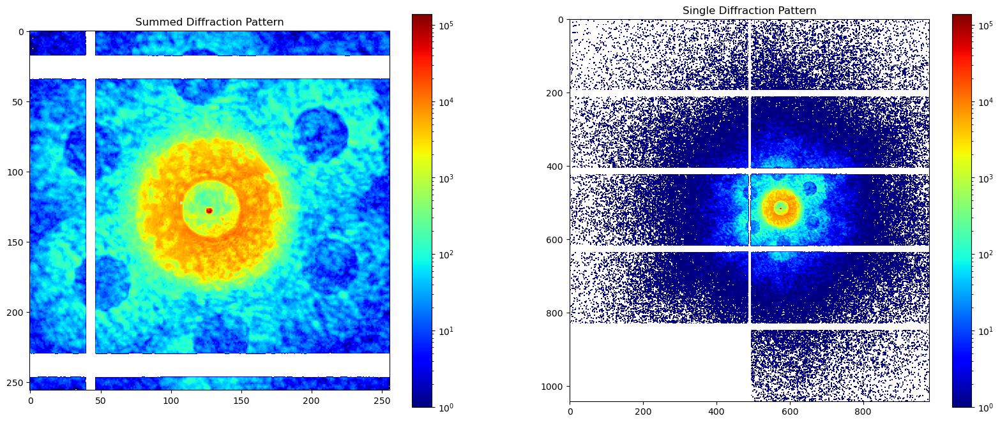

In [18]:
#scan informtion
ncols=36
nrows=29
center=(517,575)
index=664

#crop diffraction patterns
dpsize=256
dp=dps[index][center[0]-dpsize//2:center[0]+dpsize//2,
    center[1]-dpsize//2:center[1]+dpsize//2]

#plot diffraction patterns
fig, axs = plt.subplots(1, 2, figsize=(20, 8))
im1=axs[0].imshow(dp, cmap='jet',norm=colors.LogNorm())
axs[0].set_title('Summed Diffraction Pattern')
im2=axs[1].imshow(dps[index], cmap='jet',norm=colors.LogNorm())
axs[1].set_title('Single Diffraction Pattern')
plt.colorbar(im1)
plt.colorbar(im2)
plt.show()


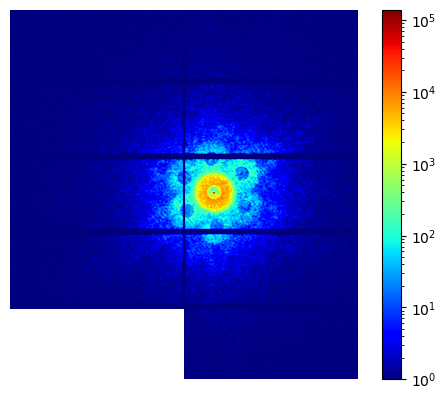

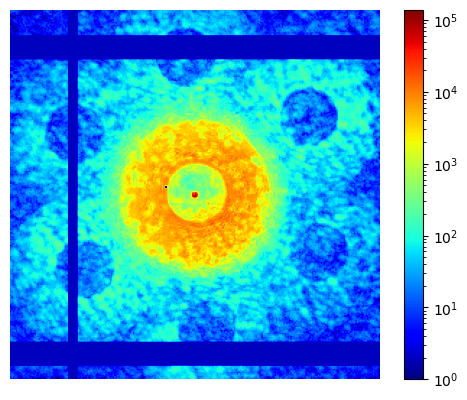

In [19]:
#plot diffraction patterns
im2=plt.imshow(dps[index]+1, cmap='jet',norm=colors.LogNorm())
plt.colorbar(im2)
plt.axis('off')
plt.show()

#plot diffraction patterns
im2=plt.imshow(np.abs(dp)+1, cmap='jet',norm=colors.LogNorm())
plt.colorbar(im2)
plt.axis('off')
plt.show()

## Preprocess and run inference on example

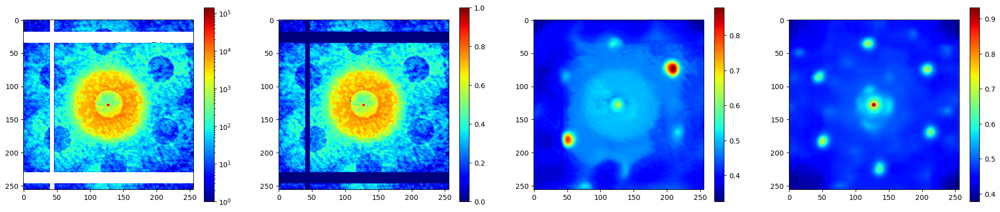

In [20]:
#preprocess diffraction pattern
dp=dps[index][center[0]-dpsize//2:center[0]+dpsize//2,
    center[1]-dpsize//2:center[1]+dpsize//2]
mask = np.load('../data/masks/mask_ZCB_9_3D.npy')
resultT, sfT, bkgT = preprocess_ZCB_9(dp,mask)

#plot diffraction pattern and deconvolved pattern
fig,ax=plt.subplots(1,4,figsize=(25,5))
im1=ax[0].imshow(dp,norm=colors.LogNorm(),cmap='jet')
im2=ax[1].imshow(resultT[0][0],cmap='jet')
im3=ax[2].imshow(models[0](resultT.to(device=device, dtype=torch.float)).detach().to("cpu").numpy()[0][0],cmap='jet')
im4=ax[3].imshow(models[-1](resultT.to(device=device, dtype=torch.float)).detach().to("cpu").numpy()[0][0],cmap='jet')
plt.colorbar(im1)
plt.colorbar(im2)
plt.colorbar(im3)
plt.colorbar(im4)
plt.show()

## Run inference for all patterns in scan

In [22]:
output_list=[]
input_list=[]
raw_list=[]
sfs=[]
bkgs=[]
mask = np.load('/home/beams/PTYCHOSAXS/deconvolutionNN/data/mask/mask_ZCB_9_3D.npy')
for i in tqdm(range(len(dps))):
    dp=dps[i][center[0]-dpsize//2:center[0]+dpsize//2,
        center[1]-dpsize//2:center[1]+dpsize//2]

    resultT, sfT, bkgT = preprocess_ZCB_9(dp,mask)
    output=models[-1](resultT.to(device=device, dtype=torch.float)).detach().to("cpu").numpy()[0][0]
    raw_list.append(dp)
    input_list.append(resultT.to("cpu").numpy()[0][0])
    output_list.append(output)
    sfs.append(sfT)
    bkgs.append(bkgT)
    
output_list=np.asarray(output_list)
raw_list=np.asarray(raw_list)
input_list=np.asarray(input_list)

100%|██████████| 1044/1044 [00:06<00:00, 151.54it/s]


## Rescale diffraction patterns corresponding to sample area

259


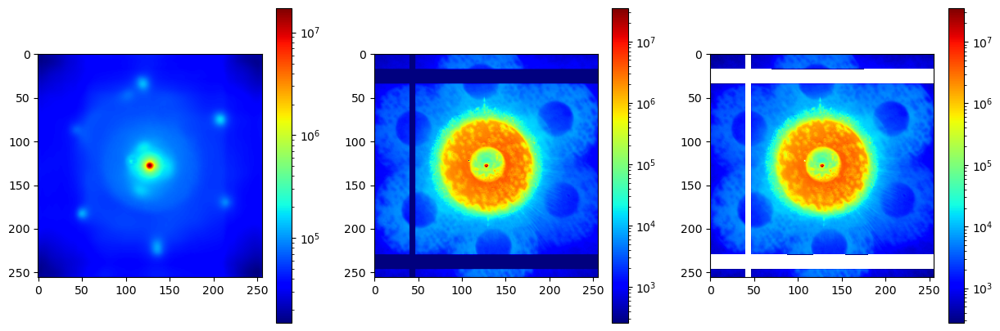

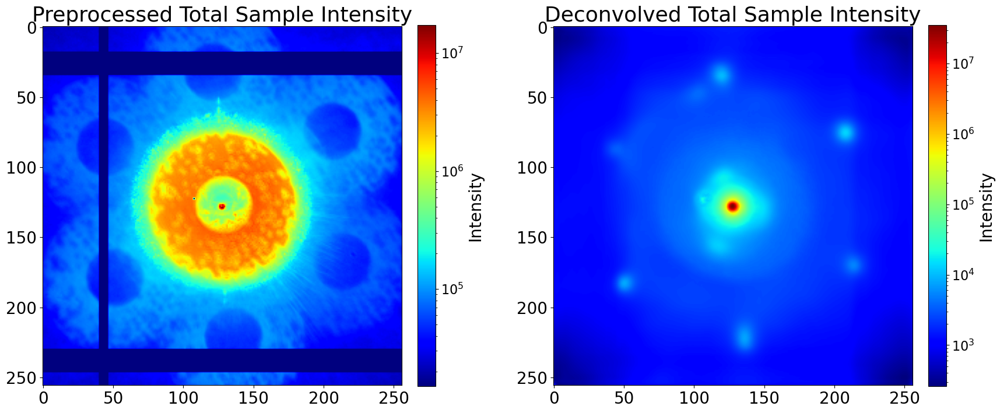

In [24]:
indices_file = "../example/04_Inference_Experimental/ZCB_9_3D_5065_sample_indices_variance_threshold.h5"
with h5py.File(indices_file, 'r') as f:
    sample_indices=f[f'scan_{scan_number}'][()]


output_list_log=[]
input_list_log=[]
raw_list_log=[]
for index in sample_indices:
    output_list_log.append(10**(output_list[index]*sfs[index]+bkgs[index]))
    input_list_log.append(10**(input_list[index]*sfs[index]+bkgs[index]))
    raw_list_log.append(raw_list[index])

print(len(output_list_log))

fig,ax=plt.subplots(1,3,figsize=(15,5))
im1=ax[0].imshow(np.sum(output_list_log,axis=0),cmap='jet',norm=colors.LogNorm())
im2=ax[1].imshow(np.sum(input_list_log,axis=0),cmap='jet',norm=colors.LogNorm())
im3=ax[2].imshow(np.sum(raw_list_log,axis=0),cmap='jet',norm=colors.LogNorm())
plt.colorbar(im1)
plt.colorbar(im2)
plt.colorbar(im3)
plt.show()


fig,ax=plt.subplots(1,2,figsize=(20,10))
plt.subplots_adjust(wspace=0.3)  # Add horizontal padding between subplots
im2=ax[1].imshow(np.sum(output_list_log,axis=0),norm=colors.LogNorm())
im1=ax[0].imshow(np.sum(input_list_log,axis=0),norm=colors.LogNorm())
ax[1].set_title('Deconvolved Total Sample Intensity',fontsize=26)
ax[0].set_title('Preprocessed Total Sample Intensity',fontsize=26)

for axis in ax:
    axis.tick_params(axis='both', which='major', labelsize=20)
    axis.tick_params(axis='both', which='minor', labelsize=20)

cbar1 = plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)
cbar2 = plt.colorbar(im2, ax=ax[0], fraction=0.046, pad=0.04)

# Set font sizes for labels and ticks
count=0
for cbar in [cbar1, cbar2, ]:
    cbar.set_label(label='Intensity',fontsize=20)
    cbar.ax.tick_params(labelsize=16)
    count+=1
plt.savefig(f'../example/04_Inference_Experimental/plots/{scan_name}_{scan_number}_{str(model_list[-1]).split("/")[-1].split(".")[0]}_deconvolved_and_preprocessed_intensity.png')
plt.show()

## ```ScanPlotter``` contains some other useful functions for visualizing deconvolutionr results

In [29]:
# Choose the model to apply
index=-1
model_type='Unet'
normalize=True
Niter=files[index]
model_applied=models[index]

print("Creating plotter...")
plotter = SP(dps, ptNN_U.preprocess_ZCB_9, mask, model_applied, scanx=36, scany=29)

print("Normalizing patterns...")
plotter.normalize_patterns(mode=['preprocessed', 'model'], method='subtract_first')

Creating plotter...
Normalizing patterns...
Calculating normalization factors...


100%|██████████| 1044/1044 [00:10<00:00, 96.22it/s]


Plotting full scan...


100%|██████████| 1044/1044 [00:01<00:00, 559.03it/s]


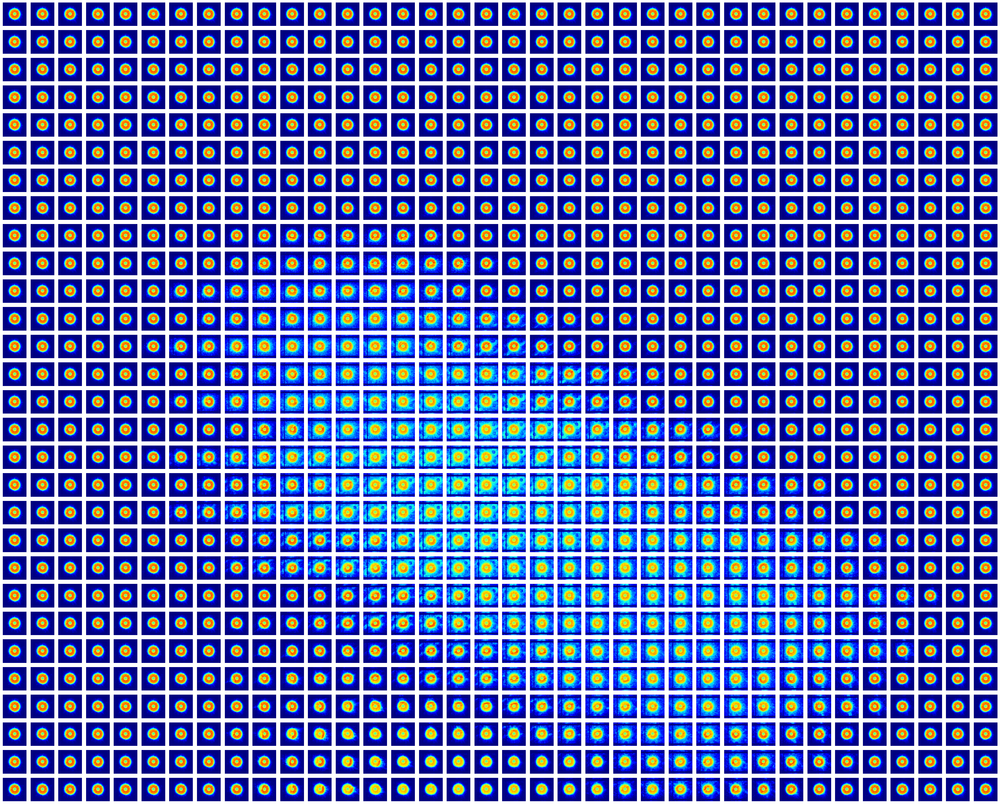

Plotting absorption map...


100%|██████████| 1044/1044 [00:00<00:00, 7827.77it/s]


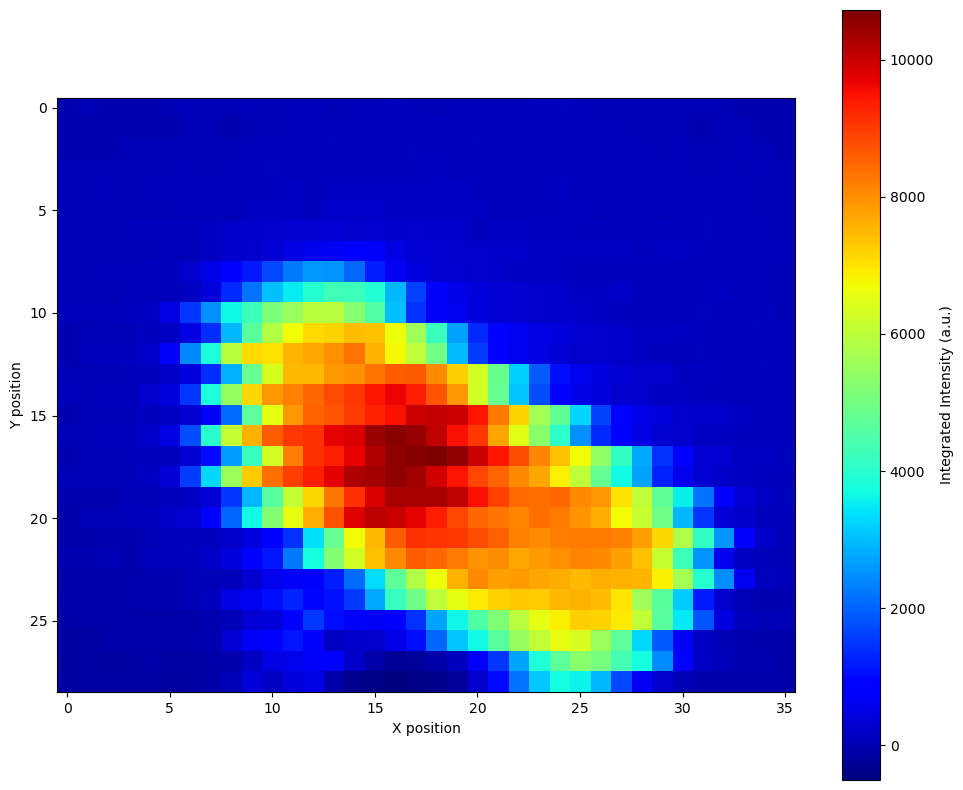

In [31]:
print("Plotting full scan...")
fig=plotter.plot_full_scan(mode='preprocessed',log_scale=False)

print("Plotting absorption map...")
absorption_map_preprocessed=plotter.plot_absorption_map(mode='preprocessed',log_scale=False,normalized=normalize)

Plotting full scan...


100%|██████████| 1044/1044 [00:01<00:00, 622.71it/s]


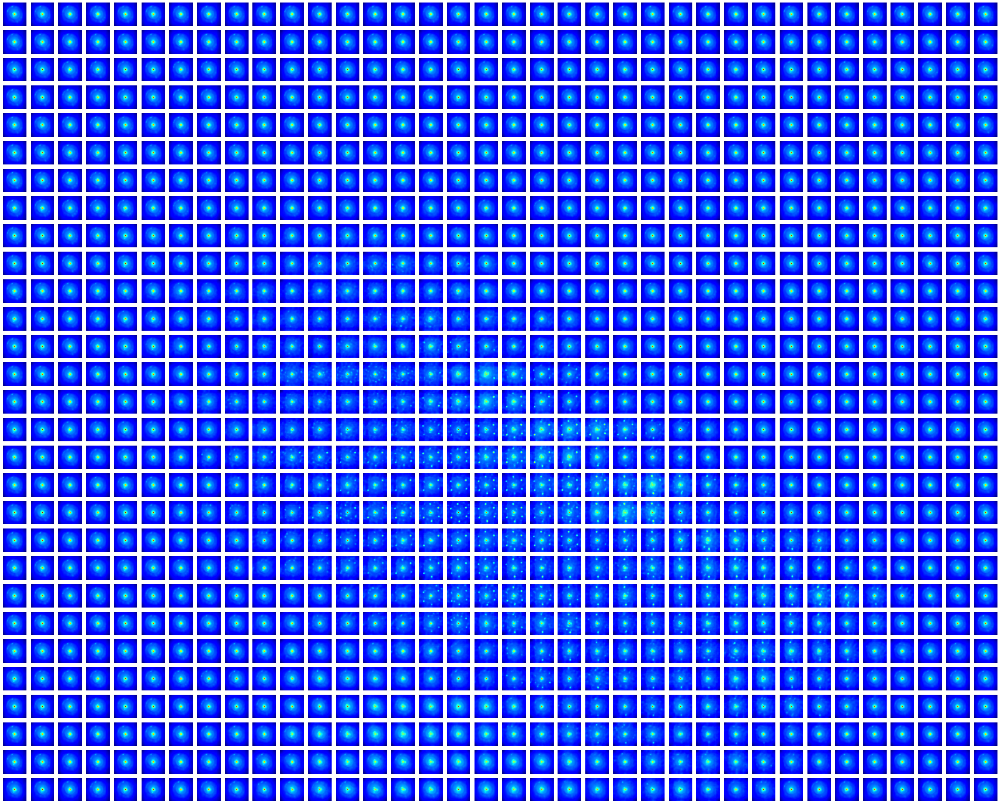

Plotting absorption map...


100%|██████████| 1044/1044 [00:00<00:00, 7581.30it/s]


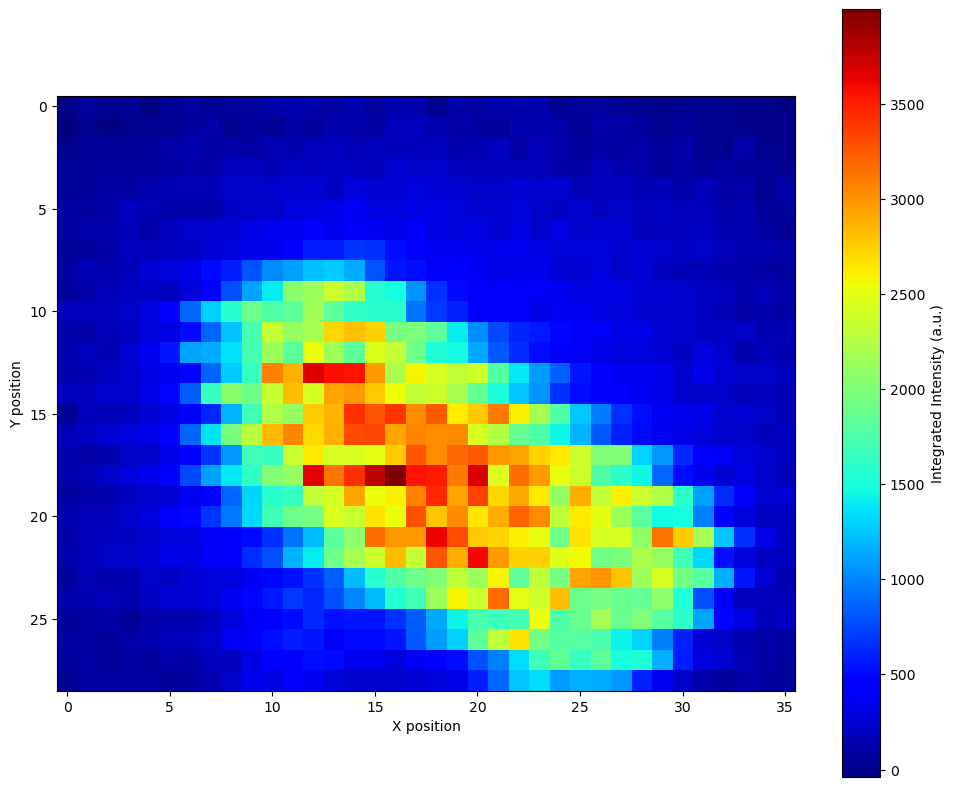

In [32]:
print("Plotting full scan...")
fig_model=plotter.plot_full_scan(mode='model',log_scale=False)

print("Plotting absorption map...")
absorption_map_model=plotter.plot_absorption_map(mode='model',log_scale=False,normalized=normalize)